# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**DUMISANI, NCUBENI, FM7**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

# Introduction

Electricity is a fundamental human right, and the Spanish government wants us to develop a machine learning model that will assist them in understanding and forecasting their energy shortfall. This will assist the government in planning ahead of time and improving and diversifying its energy mix. Spain, like most other countries, wishes to transition to a 100% renewable energy mix. Our model will not forecast how quickly they will do this, but it will get us one step closer to knowing the country's needs and how to plan ahead of time to become a blackout-proof country.

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [8]:
import numpy as np
import pandas as pd

#data viz
import matplotlib.pyplot as plt
import seaborn as sns

#####
from statsmodels.graphics.correlation import plot_corr
from scipy import stats
import matplotlib.pyplot as plt

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

- **Train data frame**

In [9]:
traindf = pd.read_csv("./df_train.csv")
#show first 5 rows of the df
traindf.head()

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.000000,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.000000,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.0,1.000000,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.0,1.000000,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.0,0.333333,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


- **Test data frame**

In [10]:
testdf = pd.read_csv('./df_test.csv')
testdf.head()

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min
0,8763,2018-01-01 00:00:00,5.000000,level_8,0.0,5.000000,87.000000,71.333333,20.000000,3.000000,...,287.816667,280.816667,287.356667,276.150000,280.380000,286.816667,285.150000,283.150000,279.866667,279.150000
1,8764,2018-01-01 03:00:00,4.666667,level_8,0.0,5.333333,89.000000,78.000000,0.000000,3.666667,...,284.816667,280.483333,284.190000,277.816667,281.010000,283.483333,284.150000,281.150000,279.193333,278.150000
2,8765,2018-01-01 06:00:00,2.333333,level_7,0.0,5.000000,89.000000,89.666667,0.000000,2.333333,...,284.483333,276.483333,283.150000,276.816667,279.196667,281.816667,282.150000,280.483333,276.340000,276.150000
3,8766,2018-01-01 09:00:00,2.666667,level_7,0.0,5.333333,93.333333,82.666667,26.666667,5.666667,...,284.150000,277.150000,283.190000,279.150000,281.740000,282.150000,284.483333,279.150000,275.953333,274.483333
4,8767,2018-01-01 12:00:00,4.000000,level_7,0.0,8.666667,65.333333,64.000000,26.666667,10.666667,...,287.483333,281.150000,286.816667,281.816667,284.116667,286.150000,286.816667,284.483333,280.686667,280.150000


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


Now we need to make a use of **concatenation** so that the changes made, applies to the whole dataset.

In [11]:
### Combining the train and test dataset.
df = pd.concat([traindf,testdf])
df.head()


,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.000000,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.000000,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.0,1.000000,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.0,1.000000,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.0,0.333333,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


With the above results, we were suppose to remove *Unnamed* column as it doesn't consist of any data we need.

In [12]:
### remove Unnamed column
df = df.drop(['Unnamed: 0'], axis=1)

Correlation analysis is a crucial technique when analysing the data, helping to identify relationships between variables in a dataset. So for us to be able to analyse correlation coefficients between variables in a dataset, lets plot a *Correlation Matrix* below.

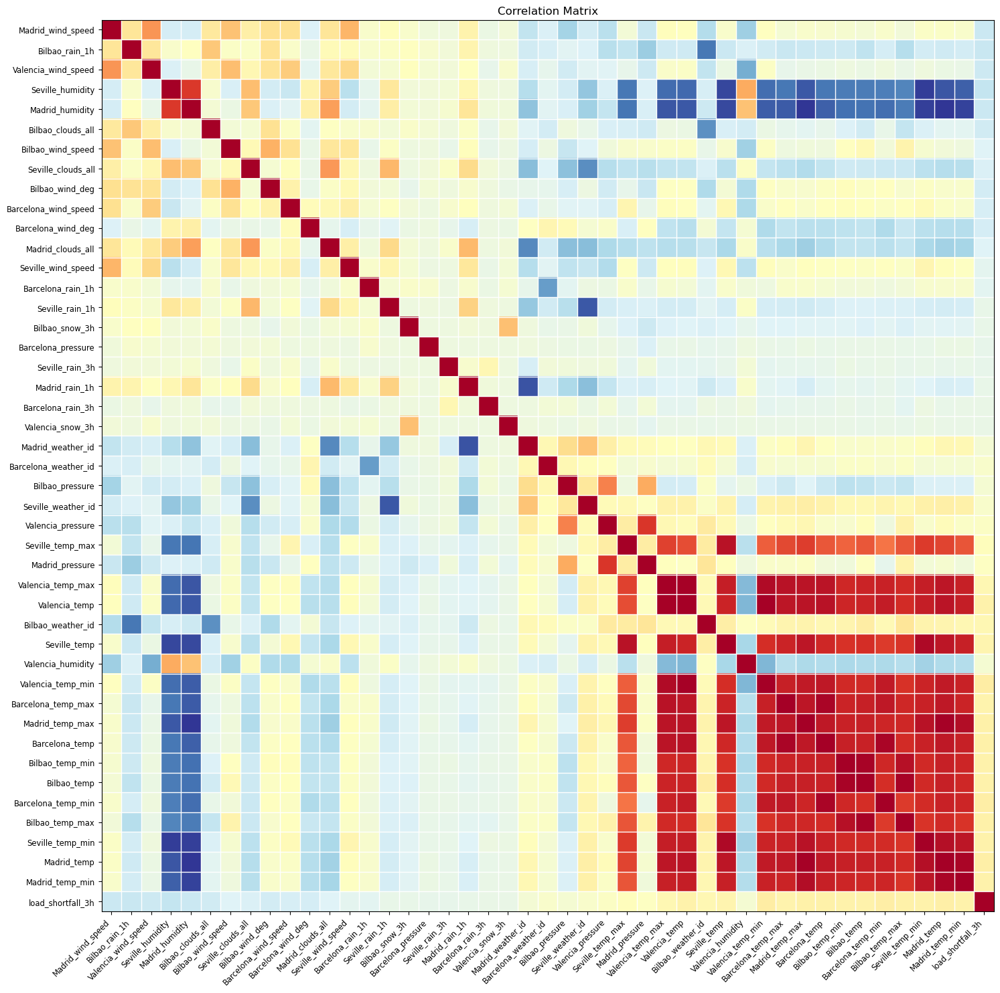

In [13]:
### Generating the Correlation Matrix
fig = plt.figure(figsize = (15,15))
axes = fig.add_subplot(111)
plot_corr(df.corr(), xnames = df.corr().columns, ax = axes)
plt.show()


Below. Is a graphical representation of the above correlation matrix.

<Axes: >

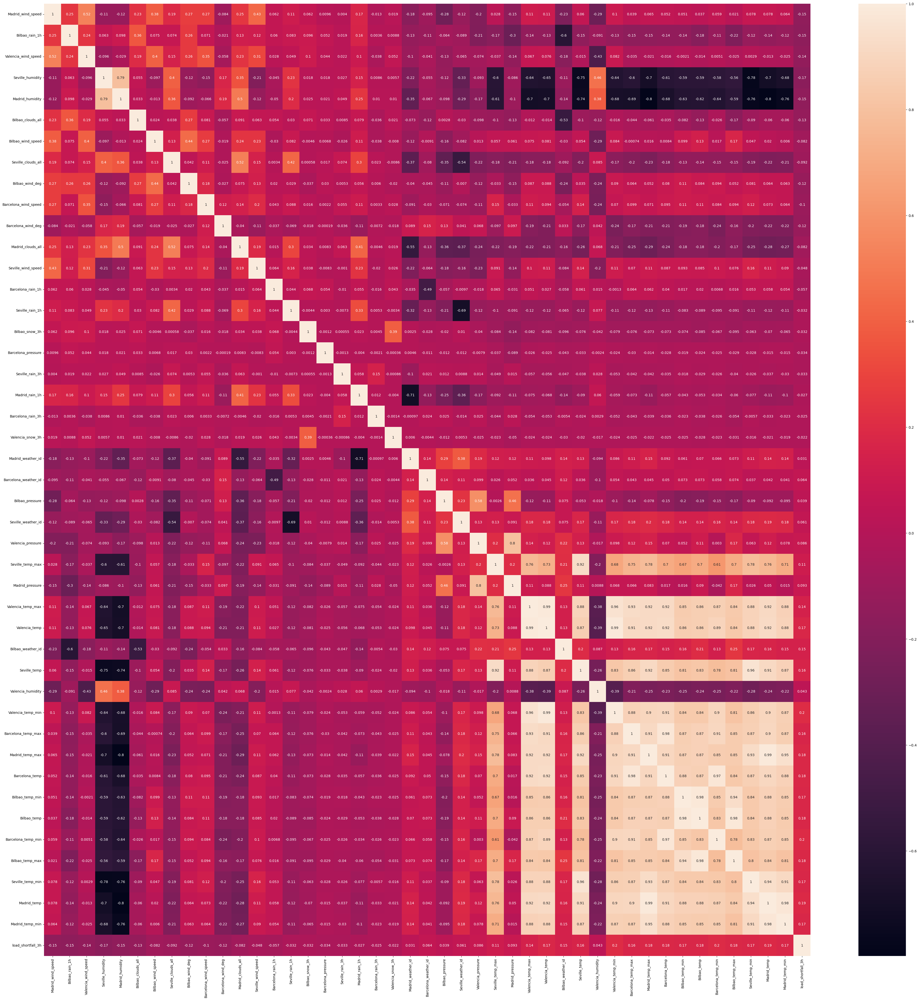

In [14]:
### Plotting the heatmap
fig, ax = plt.subplots(figsize=(50, 50))
sns.heatmap(df.corr(), annot=True)

Now lets perform an in depth analysis based on what each column consist of.

In [15]:
### Verifying the total number of rows and columns
df.shape

(11683, 48)

In [16]:
### Assessing the column names
df.columns

Index(['time', 'Madrid_wind_speed', 'Valencia_wind_deg', 'Bilbao_rain_1h',
       'Valencia_wind_speed', 'Seville_humidity', 'Madrid_humidity',
       'Bilbao_clouds_all', 'Bilbao_wind_speed', 'Seville_clouds_all',
       'Bilbao_wind_deg', 'Barcelona_wind_speed', 'Barcelona_wind_deg',
       'Madrid_clouds_all', 'Seville_wind_speed', 'Barcelona_rain_1h',
       'Seville_pressure', 'Seville_rain_1h', 'Bilbao_snow_3h',
       'Barcelona_pressure', 'Seville_rain_3h', 'Madrid_rain_1h',
       'Barcelona_rain_3h', 'Valencia_snow_3h', 'Madrid_weather_id',
       'Barcelona_weather_id', 'Bilbao_pressure', 'Seville_weather_id',
       'Valencia_pressure', 'Seville_temp_max', 'Madrid_pressure',
       'Valencia_temp_max', 'Valencia_temp', 'Bilbao_weather_id',
       'Seville_temp', 'Valencia_humidity', 'Valencia_temp_min',
       'Barcelona_temp_max', 'Madrid_temp_max', 'Barcelona_temp',
       'Bilbao_temp_min', 'Bilbao_temp', 'Barcelona_temp_min',
       'Bilbao_temp_max', 'Seville_temp_min'

With the results above. We got different cities, so for us to perform the EDA in an uncomplicated process. Let's split/group the data into cities eg. Creating a subset for *Madrid, Seville, Valencia* **etc**.

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

## 4. The EDA  and Data Engineering for each city.

- **The *Madrid* City subset.**

In [17]:
### Assigning all Madrid columns to a new variable.

Madrid = df[['Madrid_wind_speed', 
               'Madrid_humidity',
               'Madrid_clouds_all',
                 'Madrid_pressure',
                  'Madrid_rain_1h',
                   'Madrid_weather_id', 
                   'Madrid_temp_min',
                   'Madrid_temp',
                   'Madrid_temp_max']].copy()
Madrid.head()


,Madrid_wind_speed,Madrid_humidity,Madrid_clouds_all,Madrid_pressure,Madrid_rain_1h,Madrid_weather_id,Madrid_temp_min,Madrid_temp,Madrid_temp_max
0,0.666667,64.000000,0.0,971.333333,0.0,800.0,265.938000,265.938000,265.938000
1,0.333333,64.666667,0.0,972.666667,0.0,800.0,266.386667,266.386667,266.386667
2,1.000000,64.333333,0.0,974.000000,0.0,800.0,272.708667,272.708667,272.708667
3,1.000000,56.333333,0.0,994.666667,0.0,800.0,281.895219,281.895219,281.895219
4,1.000000,57.000000,0.0,1035.333333,0.0,800.0,280.678437,280.678437,280.678437


Let's remove any outliers in the Madrid subset above. In case there are any, so that we avoid them influencing our model. 

In [18]:
### remove outliers
Madrid[(np.abs(stats.zscore(Madrid)) < 3).all(axis=1)]

,Madrid_wind_speed,Madrid_humidity,Madrid_clouds_all,Madrid_pressure,Madrid_rain_1h,Madrid_weather_id,Madrid_temp_min,Madrid_temp,Madrid_temp_max
0,0.666667,64.000000,0.0,971.333333,0.0,800.0,265.938000,265.938000,265.938000
1,0.333333,64.666667,0.0,972.666667,0.0,800.0,266.386667,266.386667,266.386667
2,1.000000,64.333333,0.0,974.000000,0.0,800.0,272.708667,272.708667,272.708667
3,1.000000,56.333333,0.0,994.666667,0.0,800.0,281.895219,281.895219,281.895219
4,1.000000,57.000000,0.0,1035.333333,0.0,800.0,280.678437,280.678437,280.678437
...,...,...,...,...,...,...,...,...,...
2915,0.333333,49.666667,0.0,1031.666667,0.0,800.0,271.150000,274.910000,281.483333
2916,0.333333,28.333333,0.0,1031.333333,0.0,800.0,280.483333,283.156667,287.816667
2917,1.000000,26.333333,0.0,1030.000000,0.0,800.0,286.483333,287.733333,288.816667
2918,1.000000,56.666667,0.0,1030.333333,0.0,800.0,282.150000,283.813333,285.150000


Now let's assess the **Madrid** data-types and also verify if are there any Null-values.

In [19]:
Madrid.info()
### Madrid.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11683 entries, 0 to 2919
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Madrid_wind_speed  11683 non-null  float64
 1   Madrid_humidity    11683 non-null  float64
 2   Madrid_clouds_all  11683 non-null  float64
 3   Madrid_pressure    11683 non-null  float64
 4   Madrid_rain_1h     11683 non-null  float64
 5   Madrid_weather_id  11683 non-null  float64
 6   Madrid_temp_min    11683 non-null  float64
 7   Madrid_temp        11683 non-null  float64
 8   Madrid_temp_max    11683 non-null  float64
dtypes: float64(9)
memory usage: 912.7 KB


Since we seem to have numerical data, let us perform some **Statical Analysis** (*our five Number Summary*).

In [20]:
# Creating five Number Summary for each column.
Madrid.describe()

,Madrid_wind_speed,Madrid_humidity,Madrid_clouds_all,Madrid_pressure,Madrid_rain_1h,Madrid_weather_id,Madrid_temp_min,Madrid_temp,Madrid_temp_max
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000
mean,2.433750,58.721818,20.668692,1011.797412,0.043328,769.851665,287.056222,288.282055,289.377372
std,1.831762,24.390621,28.478087,19.983122,0.163996,81.914258,9.093455,9.258559,9.594562
min,0.000000,6.333333,0.000000,927.666667,0.000000,211.000000,264.983333,264.983333,264.983333
25%,1.000000,38.000000,0.000000,1012.666667,0.000000,800.000000,280.150000,281.250000,282.150000
50%,2.000000,59.333333,0.000000,1017.333333,0.000000,800.000000,285.816667,286.923333,287.843333
75%,3.333333,80.000000,38.333333,1021.666667,0.000000,800.666667,293.708917,294.993167,296.483333
max,13.333333,100.000000,100.000000,1038.000000,3.000000,804.000000,310.383333,313.133333,314.483333


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends.

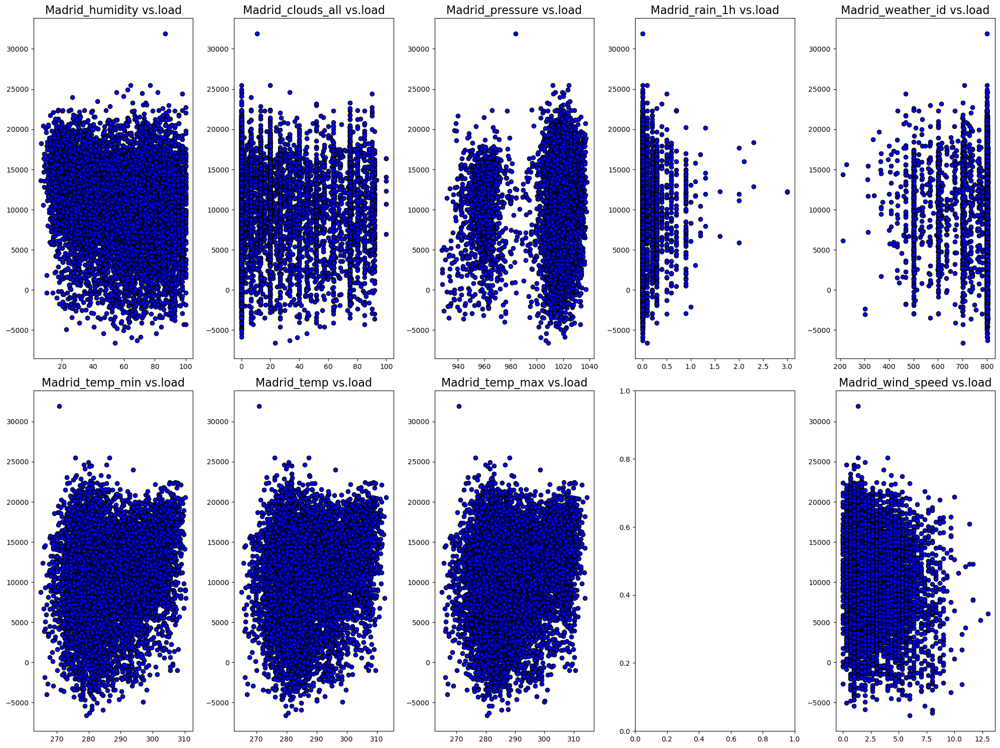

In [21]:
fig, axs = plt.subplots(2,5, figsize=(20,15),)
fig.subplots_adjust(hspace = 0.5, wspace=.2)
axs = axs.ravel()

for index, column in enumerate(Madrid.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)

Since the **Madrid** subset is in a Numerical format, let's make a use of the **PairPlot**.

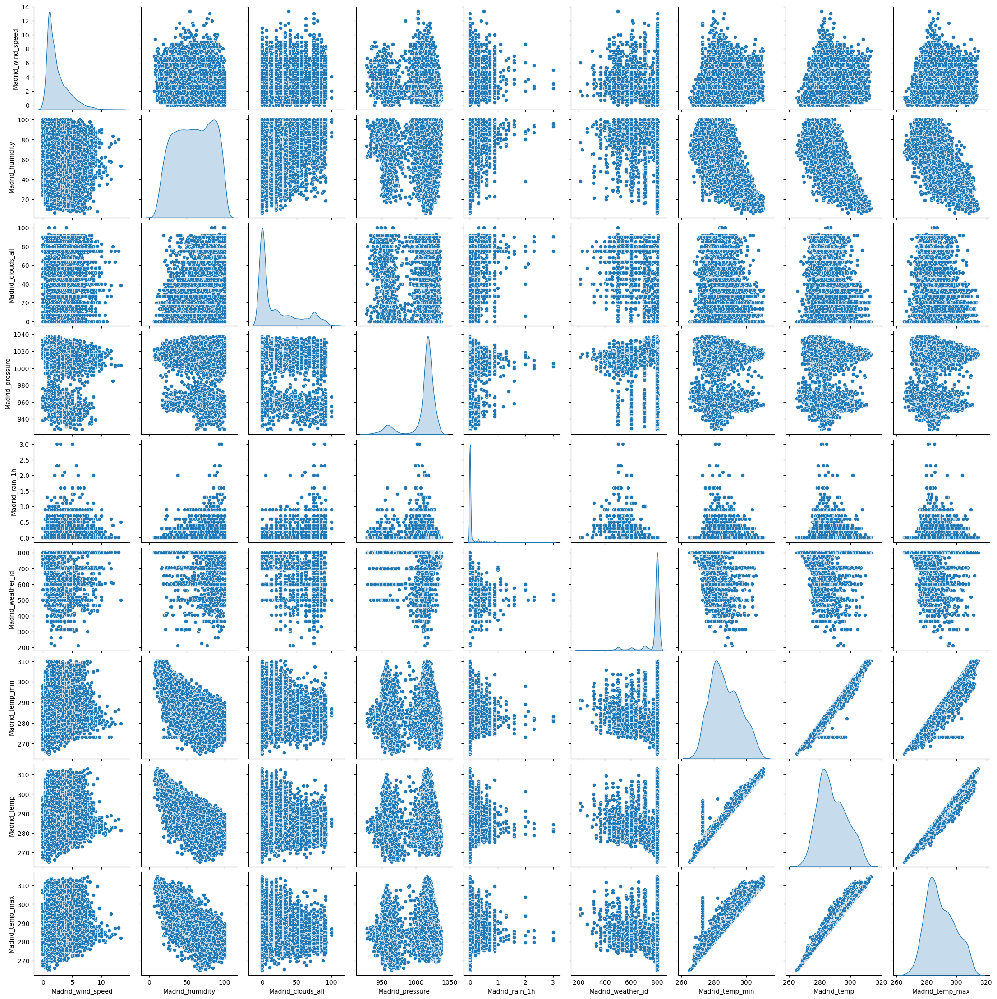

In [22]:
sns.pairplot(Madrid, diag_kind='kde')

For us to handle any of the outliers, let's make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

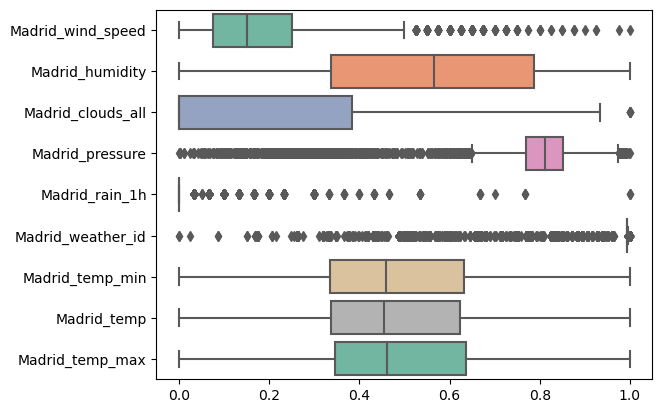

In [23]:
from sklearn.preprocessing import MinMaxScaler

# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Madrid_ = pd.DataFrame(scaler.fit_transform(Madrid), columns=Madrid.columns)
sns.boxplot(data=Madrid_, orient="h", palette="Set2")

In [24]:
# sns.histplot(Madrid,kde=True)

We previously assessed the correlation of the entire dataset, now let's assess the correlation of the **Madrid** subset.

<Axes: >

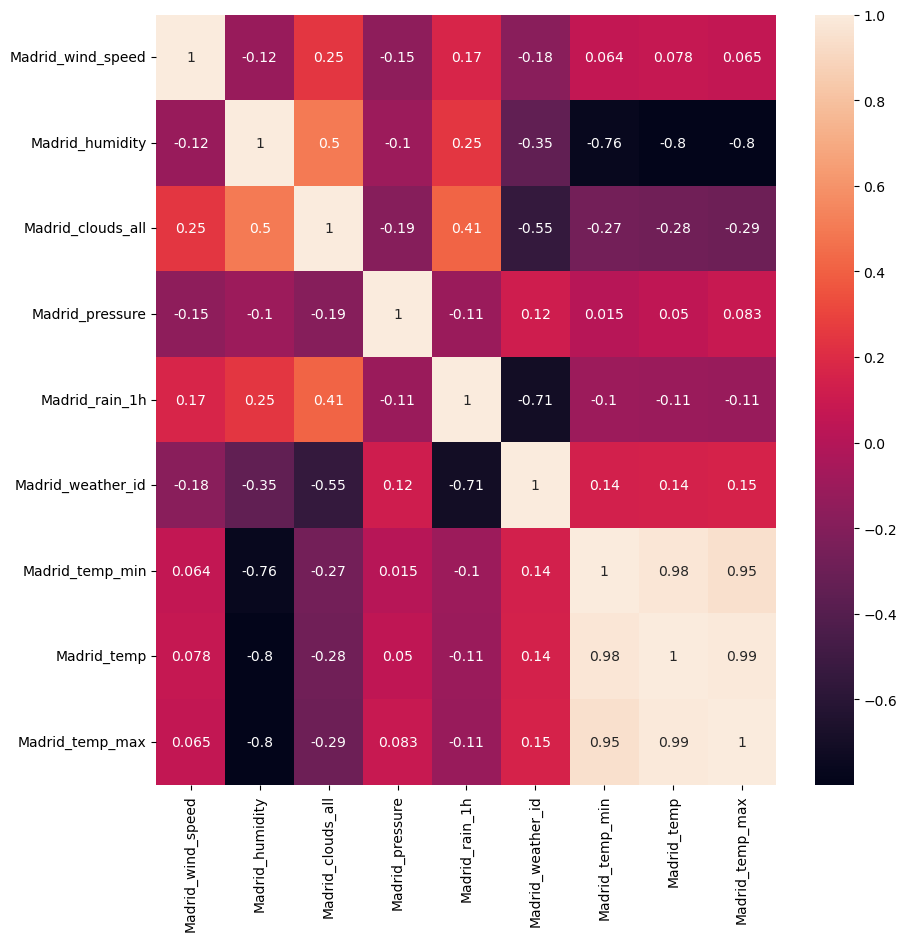

In [25]:
# Assessing the correlation of the dataset using the HEATMAP
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Madrid.corr(), annot=True)

- **The *Seville* City subset.**

In [26]:
### Assigning all Seville columns to a new variable.
Seville = df[['Seville_humidity',
                 'Seville_clouds_all',
                   'Seville_wind_speed',
                'Seville_pressure', 
                'Seville_rain_1h',
                 'Seville_rain_3h',
                 'Seville_weather_id',
                 'Seville_temp_max',
                 'Seville_temp',
                 'Seville_temp_min']].copy()

Seville.head()

,Seville_humidity,Seville_clouds_all,Seville_wind_speed,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_temp_max,Seville_temp,Seville_temp_min
0,74.333333,0.0,3.333333,sp25,0.0,0.0,800.0,274.254667,274.254667,274.254667
1,78.333333,0.0,3.333333,sp25,0.0,0.0,800.0,274.945000,274.945000,274.945000
2,71.333333,0.0,2.666667,sp25,0.0,0.0,800.0,278.792000,278.792000,278.792000
3,65.333333,0.0,4.000000,sp25,0.0,0.0,800.0,285.394000,285.394000,285.394000
4,59.000000,0.0,3.000000,sp25,0.0,0.0,800.0,285.513719,285.513719,285.513719


In [27]:
Seville[["Seville_pressure"]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11683 entries, 0 to 2919
Data columns (total 1 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Seville_pressure  11683 non-null  object
dtypes: object(1)
memory usage: 182.5+ KB


Looking at the above results, the column **Seville_pressure** consist of the **object** datatype. So let us try to convert it to a **Numerical** datatype format.

In [28]:
### reformatting the data to the correct type
Seville['Seville_pressure'] = Seville['Seville_pressure'].astype(str).str.extract('(\d+)', expand=False).astype(int)

##Seville['Seville_rain_3h'].unique().sum()

Let's remove any outliers in the **Seville** subset above. In case there are any, so that we avoid them influencing our model

In [29]:
# ### remove outliers
Seville[(np.abs(stats.zscore(Seville)) < 3).all(axis=1)]

,Seville_humidity,Seville_clouds_all,Seville_wind_speed,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_temp_max,Seville_temp,Seville_temp_min
0,74.333333,0.0,3.333333,25,0.0,0.0,800.0,274.254667,274.254667,274.254667
1,78.333333,0.0,3.333333,25,0.0,0.0,800.0,274.945000,274.945000,274.945000
2,71.333333,0.0,2.666667,25,0.0,0.0,800.0,278.792000,278.792000,278.792000
3,65.333333,0.0,4.000000,25,0.0,0.0,800.0,285.394000,285.394000,285.394000
4,59.000000,0.0,3.000000,25,0.0,0.0,800.0,285.513719,285.513719,285.513719
...,...,...,...,...,...,...,...,...,...,...
2915,81.666667,0.0,2.000000,24,0.0,0.0,800.0,280.816667,280.210000,279.816667
2916,61.000000,0.0,4.000000,24,0.0,0.0,800.0,287.483333,287.280000,287.150000
2917,47.000000,0.0,4.666667,23,0.0,0.0,800.0,290.816667,290.816667,290.816667
2918,52.666667,0.0,3.333333,23,0.0,0.0,800.0,288.816667,288.300000,287.483333


In [30]:
Seville.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11683 entries, 0 to 2919
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Seville_humidity    11683 non-null  float64
 1   Seville_clouds_all  11683 non-null  float64
 2   Seville_wind_speed  11683 non-null  float64
 3   Seville_pressure    11683 non-null  int32  
 4   Seville_rain_1h     11683 non-null  float64
 5   Seville_rain_3h     11683 non-null  float64
 6   Seville_weather_id  11683 non-null  float64
 7   Seville_temp_max    11683 non-null  float64
 8   Seville_temp        11683 non-null  float64
 9   Seville_temp_min    11683 non-null  float64
dtypes: float64(9), int32(1)
memory usage: 958.4 KB


Looking at column **Seville_pressure**, the datatype was successfully converted to the numerical datatype. Now with the numerical data we have, let us perform some **Statical Analysis** (our five Number Summary).

In [31]:
Seville.describe()

,Seville_humidity,Seville_clouds_all,Seville_wind_speed,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_temp_max,Seville_temp,Seville_temp_min
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000
mean,63.774687,14.155268,2.483067,12.780193,0.041120,0.000182,774.050843,296.007363,293.170948,291.263219
std,22.219380,24.541321,1.705508,7.270223,0.180425,0.003171,72.909418,8.929160,7.998774,8.136234
min,8.333333,0.000000,0.000000,1.000000,0.000000,0.000000,200.000000,272.063000,272.063000,270.150000
25%,46.333333,0.000000,1.000000,6.000000,0.000000,0.000000,800.000000,289.483333,287.403167,285.483333
50%,67.000000,0.000000,2.000000,13.000000,0.000000,0.000000,800.000000,295.483333,292.470000,290.382000
75%,83.000000,20.000000,3.333333,19.000000,0.000000,0.000000,800.000000,302.816667,298.806667,296.641333
max,100.000000,97.333333,12.666667,25.000000,3.000000,0.093333,804.000000,320.483333,314.976667,314.816667


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends.

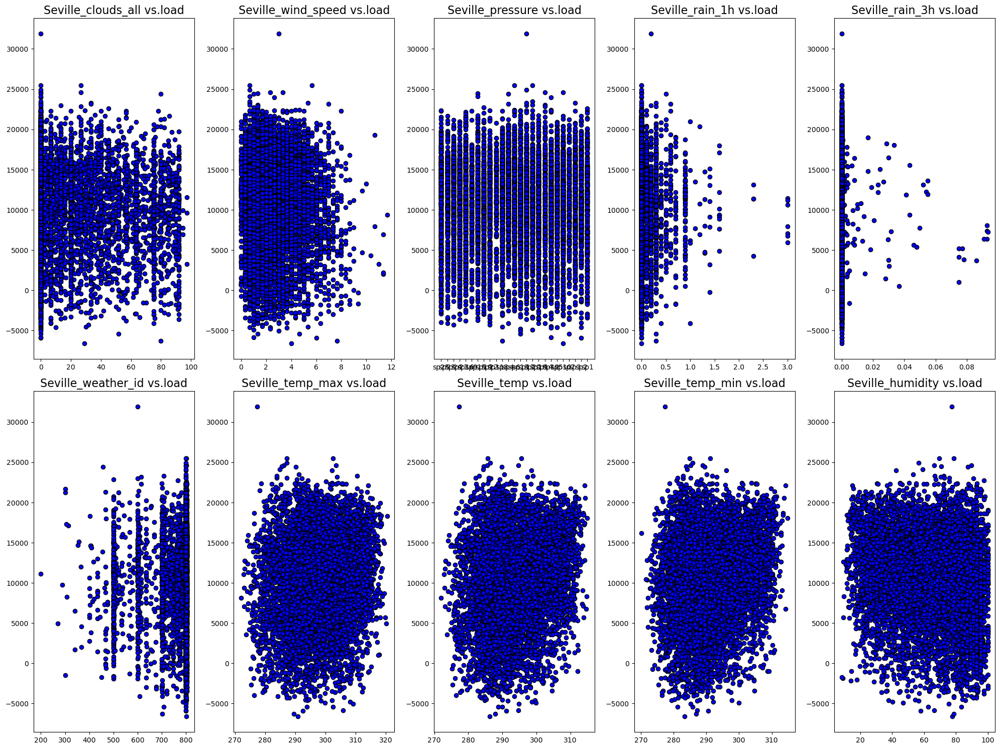

In [32]:
fig, axs = plt.subplots(2,5, figsize=(20,15),)
fig.subplots_adjust(hspace = 0.5, wspace=.2)
axs = axs.ravel()

for index, column in enumerate(Seville.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)



Let us make a use of the **PairPlot.**

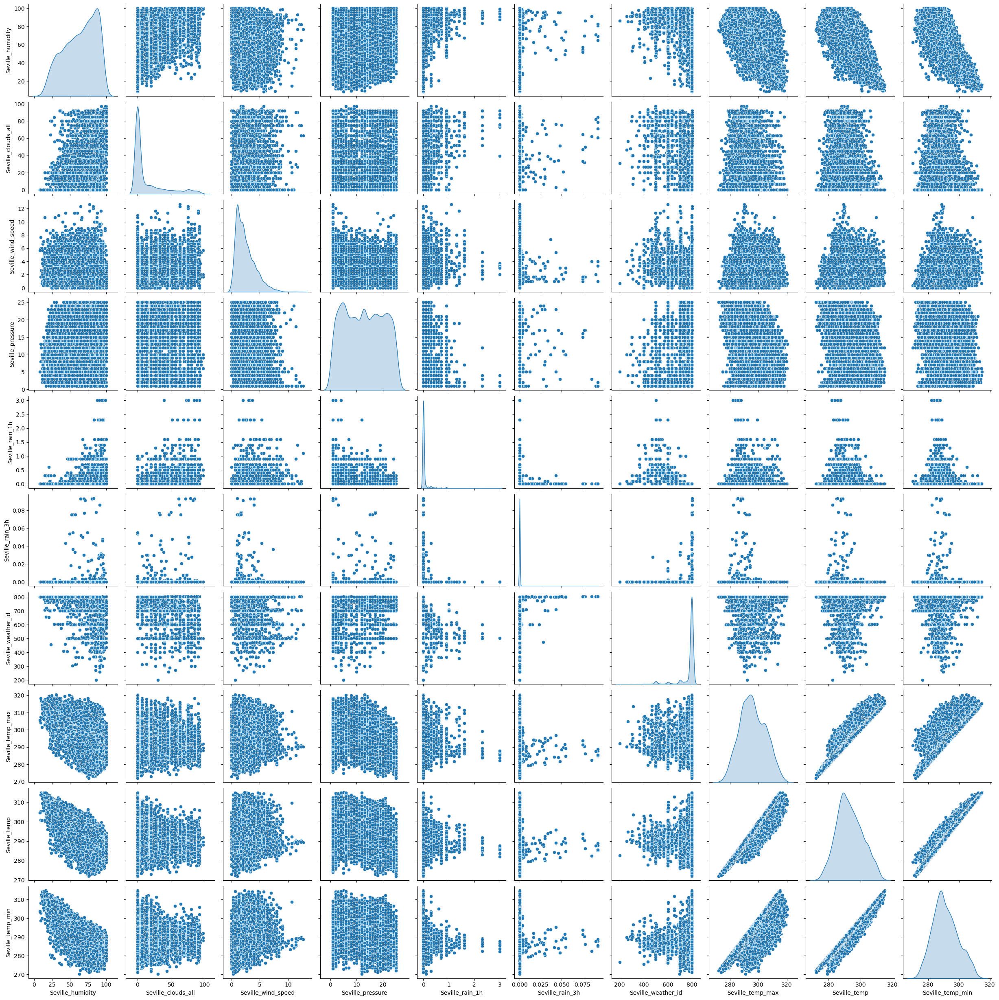

In [33]:
 
sns.pairplot(Seville, diag_kind='kde')


For us to handle any of the outliers, let's make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

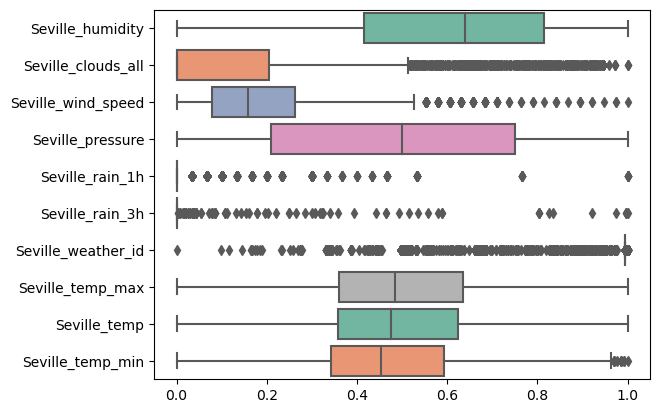

In [34]:
# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Seville_ = pd.DataFrame(scaler.fit_transform(Seville), columns=Seville.columns)
sns.boxplot(data=Seville_, orient="h", palette="Set2")
#


In [35]:
# sns.histplot(Seville,kde=True)
#


Using the **heatmap**, let us assess the correlation of the **Seville** subset.

<Axes: >

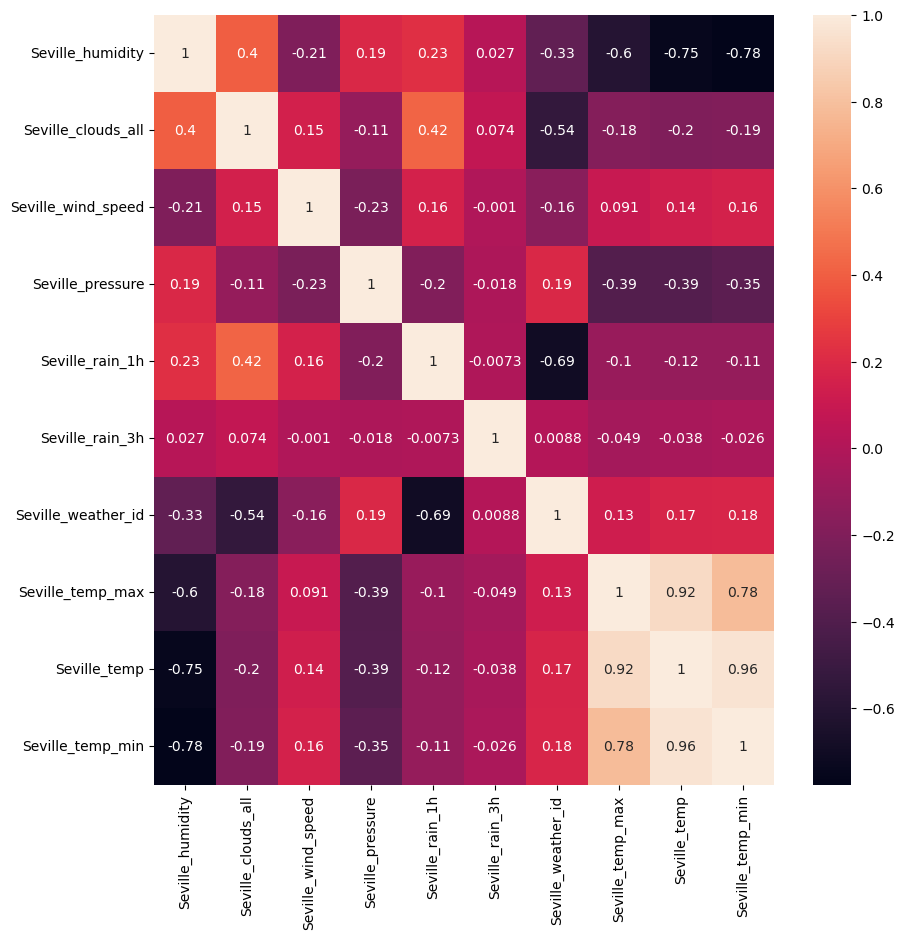

In [36]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Seville.corr(), annot=True)
#

- **The *Barcelona* City subset.**

In [37]:
### Assigning all Barcelona columns to a new variable.

Barcelona = df[[ 'Barcelona_wind_speed',
       'Barcelona_wind_deg',
         'Barcelona_rain_1h', 
        'Barcelona_pressure', 
        'Barcelona_rain_3h',
        'Barcelona_weather_id', 
        'Barcelona_temp_max',
          'Barcelona_temp',
       'Barcelona_temp_min']].copy()
Barcelona.head() 

,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_rain_1h,Barcelona_pressure,Barcelona_rain_3h,Barcelona_weather_id,Barcelona_temp_max,Barcelona_temp,Barcelona_temp_min
0,6.333333,42.666667,0.0,1036.333333,0.0,800.0,281.013000,281.013000,281.013000
1,4.000000,139.000000,0.0,1037.333333,0.0,800.0,280.561667,280.561667,280.561667
2,2.000000,326.000000,0.0,1038.000000,0.0,800.0,281.583667,281.583667,281.583667
3,2.333333,273.000000,0.0,1037.000000,0.0,800.0,283.434104,283.434104,283.434104
4,4.333333,260.000000,0.0,1035.000000,0.0,800.0,284.213167,284.213167,284.213167


Let's remove any outliers in the **Barcelona** subset above. In case there are any, so that we avoid them influencing our model.

In [38]:
### remove outliers
Barcelona[(np.abs(stats.zscore(Barcelona)) < 3).all(axis=1)]

,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_rain_1h,Barcelona_pressure,Barcelona_rain_3h,Barcelona_weather_id,Barcelona_temp_max,Barcelona_temp,Barcelona_temp_min
0,6.333333,42.666667,0.0,1036.333333,0.0,800.0,281.013000,281.013000,281.013000
1,4.000000,139.000000,0.0,1037.333333,0.0,800.0,280.561667,280.561667,280.561667
2,2.000000,326.000000,0.0,1038.000000,0.0,800.0,281.583667,281.583667,281.583667
3,2.333333,273.000000,0.0,1037.000000,0.0,800.0,283.434104,283.434104,283.434104
4,4.333333,260.000000,0.0,1035.000000,0.0,800.0,284.213167,284.213167,284.213167
...,...,...,...,...,...,...,...,...,...
2915,6.333333,320.000000,0.0,1029.666667,0.0,800.0,279.816667,278.140000,276.483333
2916,2.666667,293.333333,0.0,1028.666667,0.0,800.0,286.483333,286.150000,285.816667
2917,2.666667,233.333333,0.0,1027.000000,0.0,800.0,289.483333,288.820000,288.150000
2918,2.333333,253.333333,0.0,1027.000000,0.0,800.0,285.816667,284.473333,283.150000


Now let's assess the **Barcelona** data-types and also verify if are there any Null-values.

In [39]:
Barcelona.info()
# Barcelona.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11683 entries, 0 to 2919
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Barcelona_wind_speed  11683 non-null  float64
 1   Barcelona_wind_deg    11683 non-null  float64
 2   Barcelona_rain_1h     11683 non-null  float64
 3   Barcelona_pressure    11683 non-null  float64
 4   Barcelona_rain_3h     11683 non-null  float64
 5   Barcelona_weather_id  11683 non-null  float64
 6   Barcelona_temp_max    11683 non-null  float64
 7   Barcelona_temp        11683 non-null  float64
 8   Barcelona_temp_min    11683 non-null  float64
dtypes: float64(9)
memory usage: 912.7 KB


Since we seem to have numerical data, let us perform some **Statical Analysis** (our five Number Summary).

In [40]:
Barcelona.describe()

,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_rain_1h,Barcelona_pressure,Barcelona_rain_3h,Barcelona_weather_id,Barcelona_temp_max,Barcelona_temp,Barcelona_temp_min
count,11683.000000,11683.000000,11683.000000,1.168300e+04,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000
mean,2.782419,187.654241,0.108534,1.287326e+03,0.000331,764.603446,291.042128,289.869413,288.616766
std,1.758587,88.694717,0.556794,1.218906e+04,0.003466,90.736191,7.236360,6.680538,6.391989
min,0.000000,0.000000,0.000000,6.706667e+02,0.000000,200.666667,272.150000,270.816667,269.483333
25%,1.333333,116.666667,0.000000,1.013667e+03,0.000000,800.000000,285.338609,284.816667,284.150000
50%,2.333333,193.333333,0.000000,1.017333e+03,0.000000,800.000000,290.150000,289.426667,288.276333
75%,3.666667,260.000000,0.000000,1.021167e+03,0.000000,801.000000,296.816667,295.150000,293.483333
max,12.666667,360.000000,12.000000,1.001411e+06,0.093000,804.000000,314.076667,308.150000,306.816667


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends

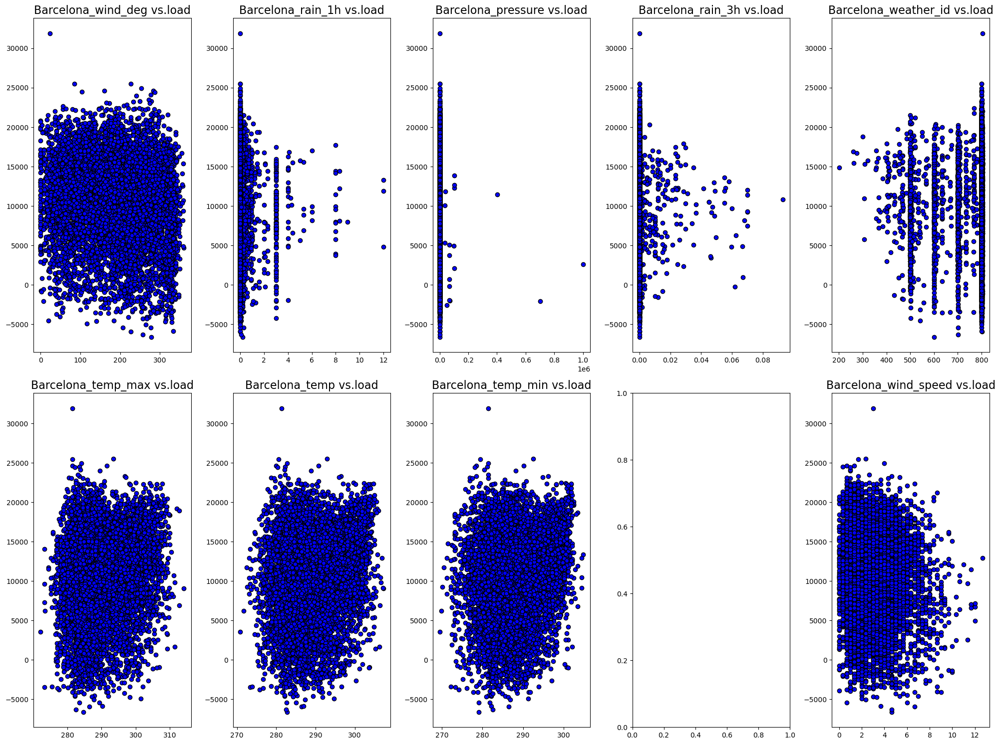

In [41]:
fig, axs = plt.subplots(2,5, figsize=(20,15),)
fig.subplots_adjust(hspace = 0.5, wspace=.2)
axs = axs.ravel()

for index, column in enumerate(Barcelona.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)



Since the **Barcelona** subset is in a Numerical format, let's make a use of the **PairPlot**.

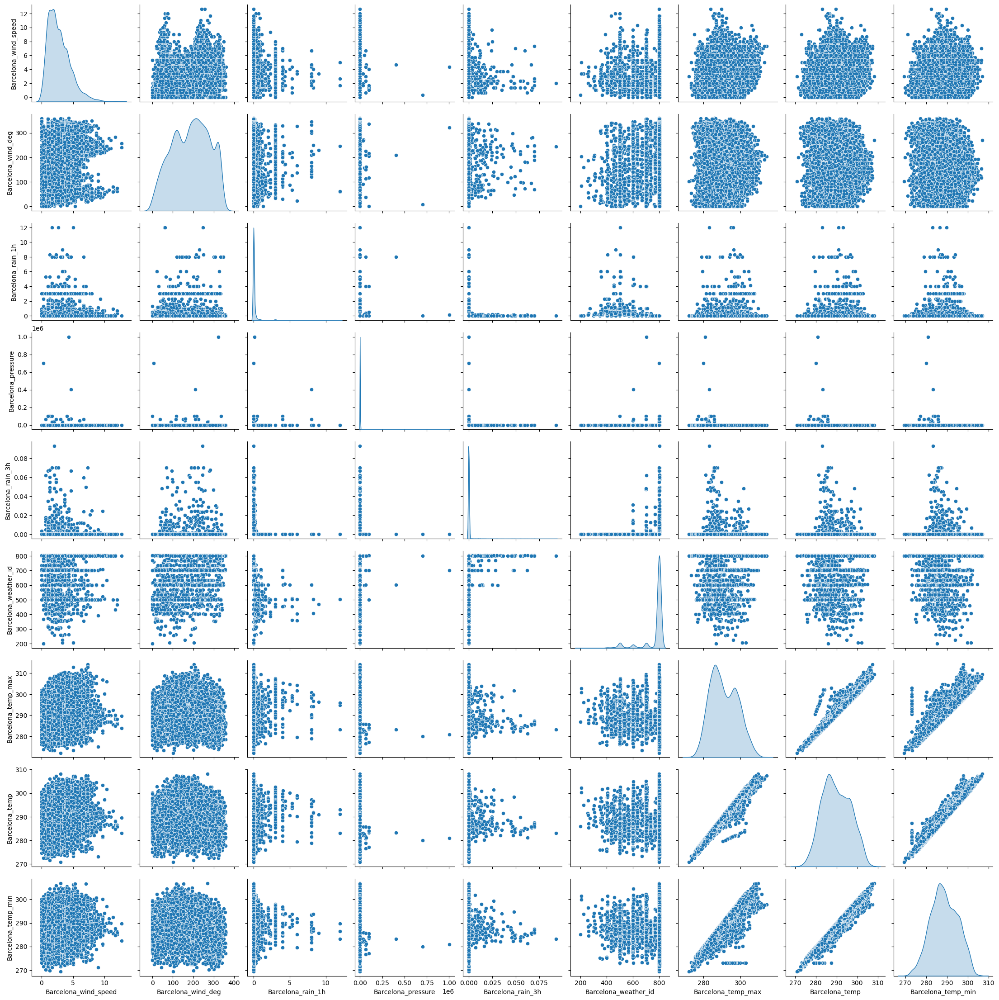

In [42]:
#
sns.pairplot(Barcelona, diag_kind='kde')
#


For us to handle any of the outliers, let's make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

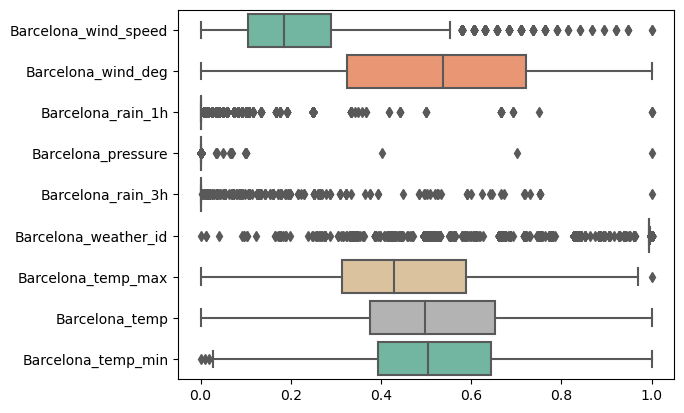

In [43]:
# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Barcelona_ = pd.DataFrame(scaler.fit_transform(Barcelona), columns=Barcelona.columns)
sns.boxplot(data=Barcelona_, orient="h", palette="Set2")


In [44]:
#
# sns.histplot(Barcelona,kde=True)


Using the **heatmap** now let us assess the correlation of the **Barcelona** subset.

<Axes: >

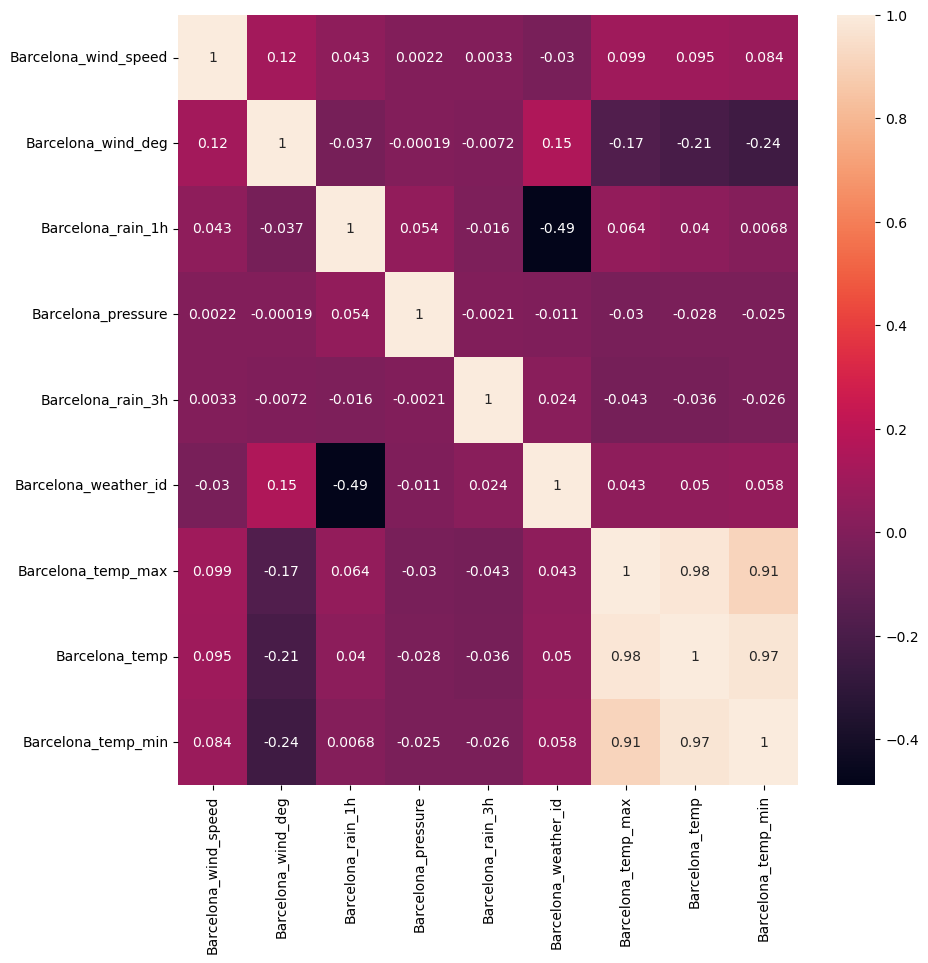

In [45]:
#
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Barcelona.corr(), annot=True)
#

- **The *Valencia* City subset.**

In [46]:
### Assigning all Valencia columns to a new variable.

Valencia = df[['Valencia_wind_speed',
               'Valencia_wind_deg',
               'Valencia_humidity',
                'Valencia_snow_3h',
                'Valencia_pressure',
              'Valencia_temp_max',
               'Valencia_temp',
               'Valencia_temp_min']].copy()
Valencia.head()

,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_temp_min
0,0.666667,level_5,75.666667,0.0,1002.666667,269.888000,269.888000,269.888000
1,1.666667,level_10,71.000000,0.0,1004.333333,271.728333,271.728333,271.728333
2,1.000000,level_9,65.666667,0.0,1005.333333,278.008667,278.008667,278.008667
3,1.000000,level_8,54.000000,0.0,1009.000000,284.899552,284.899552,284.899552
4,1.000000,level_7,58.333333,0.0,NaN,283.015115,283.015115,283.015115


With the results above, taking look at the **Valencia_pressure** column row number 4. There is a missing value, so now lets perform an in depth analysis for the missing values within the **Valencia** subset.

In [47]:
### Valencia_pressure has 2068 out of 8763 total values missing
Valencia['Valencia_pressure'].fillna(Valencia['Valencia_pressure'].median(), inplace=True) # mean = 1012.0514065222798  , mode = 1018 , median = 1015

In [48]:
Valencia.head()

,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_temp_min
0,0.666667,level_5,75.666667,0.0,1002.666667,269.888000,269.888000,269.888000
1,1.666667,level_10,71.000000,0.0,1004.333333,271.728333,271.728333,271.728333
2,1.000000,level_9,65.666667,0.0,1005.333333,278.008667,278.008667,278.008667
3,1.000000,level_8,54.000000,0.0,1009.000000,284.899552,284.899552,284.899552
4,1.000000,level_7,58.333333,0.0,1015.000000,283.015115,283.015115,283.015115


Now our problem with the missing values is resolved. So looking at the column **Valencia_wind_deg**, the column consist of the **Object** datatype. So let us convert it into a **Numerical** datatype format.

In [49]:
### reformatting the data to the correct type
Valencia['Valencia_wind_deg'] = Valencia['Valencia_wind_deg'].astype(str).str.extract('(\d+)', expand=False).astype(int)

Now let's verify the column **Valencia_wind_deg** datatype has been converted succesfully and also get rid of the outliers if there are any, so the we avoid them influencing the overall distribution.

In [50]:
Valencia.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11683 entries, 0 to 2919
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Valencia_wind_speed  11683 non-null  float64
 1   Valencia_wind_deg    11683 non-null  int32  
 2   Valencia_humidity    11683 non-null  float64
 3   Valencia_snow_3h     11683 non-null  float64
 4   Valencia_pressure    11683 non-null  float64
 5   Valencia_temp_max    11683 non-null  float64
 6   Valencia_temp        11683 non-null  float64
 7   Valencia_temp_min    11683 non-null  float64
dtypes: float64(7), int32(1)
memory usage: 775.8 KB


In [51]:
### remove outliers
Valencia[(np.abs(stats.zscore(Valencia)) < 3).all(axis=1)]

,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_temp_min
0,0.666667,5,75.666667,0.0,1002.666667,269.888000,269.888000,269.888000
1,1.666667,10,71.000000,0.0,1004.333333,271.728333,271.728333,271.728333
2,1.000000,9,65.666667,0.0,1005.333333,278.008667,278.008667,278.008667
3,1.000000,8,54.000000,0.0,1009.000000,284.899552,284.899552,284.899552
4,1.000000,7,58.333333,0.0,1015.000000,283.015115,283.015115,283.015115
...,...,...,...,...,...,...,...,...
2915,2.000000,9,69.666667,0.0,1015.000000,279.816667,279.323333,278.816667
2916,1.333333,8,32.000000,0.0,1015.000000,290.816667,290.323333,289.816667
2917,3.000000,6,23.666667,0.0,1015.000000,293.483333,293.483333,293.483333
2918,2.000000,6,59.000000,0.0,1015.000000,286.483333,285.976667,285.483333


Now tha we managed to handle the *Missing values, Outliers and the correct format of the datatype*, let us perform some **Statical Analysis** (our five Number Summary).

In [52]:
Valencia.describe()

,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_temp_min
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000
mean,2.692873,5.476590,65.091814,0.000154,1012.919456,291.362722,290.788513,290.229939
std,2.321759,2.863384,19.040927,0.010277,7.883832,7.441278,7.157835,7.003619
min,0.000000,1.000000,10.333333,0.000000,972.666667,269.888000,269.888000,269.888000
25%,1.000000,3.000000,51.333333,0.000000,1012.333333,285.783333,285.395500,284.928833
50%,2.000000,5.000000,66.333333,0.000000,1015.000000,291.150000,290.483333,289.820000
75%,3.666667,8.000000,80.666667,0.000000,1017.000000,297.159167,296.437500,295.491667
max,52.000000,10.000000,100.000000,0.791667,1021.666667,314.263333,310.426667,310.272000


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends.

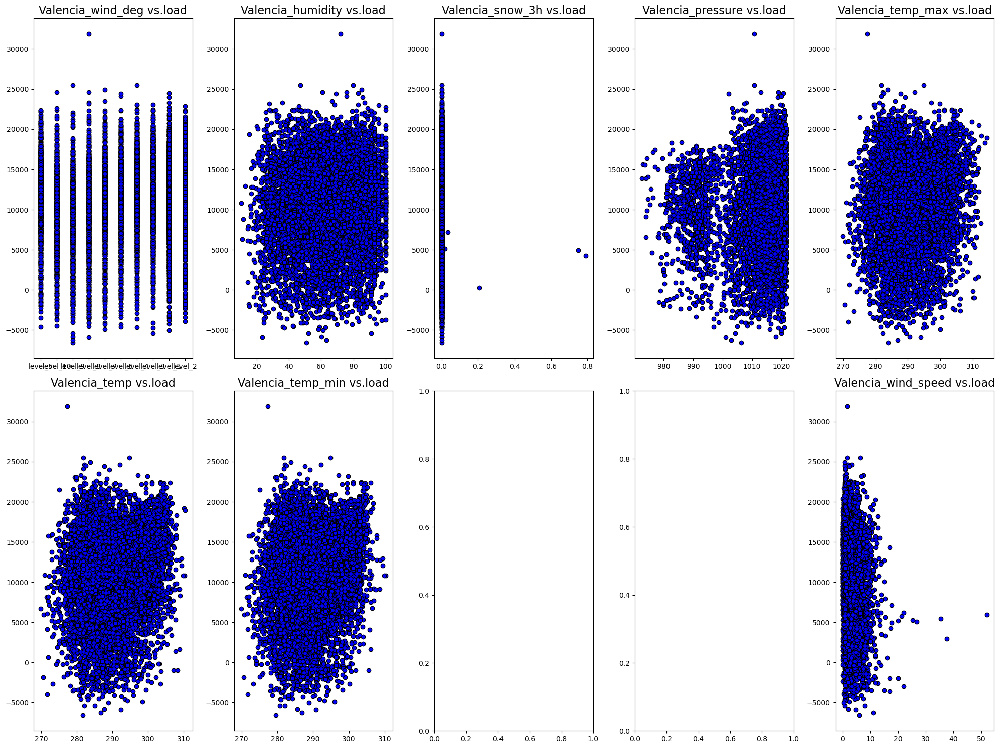

In [53]:
fig, axs = plt.subplots(2,5, figsize=(20,15),)
fig.subplots_adjust(hspace = 0.5, wspace=.2)
axs = axs.ravel()

for index, column in enumerate(Valencia.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)



Our **Valencia** subset is now in a Numerical format, let's make a use of the PairPlot.

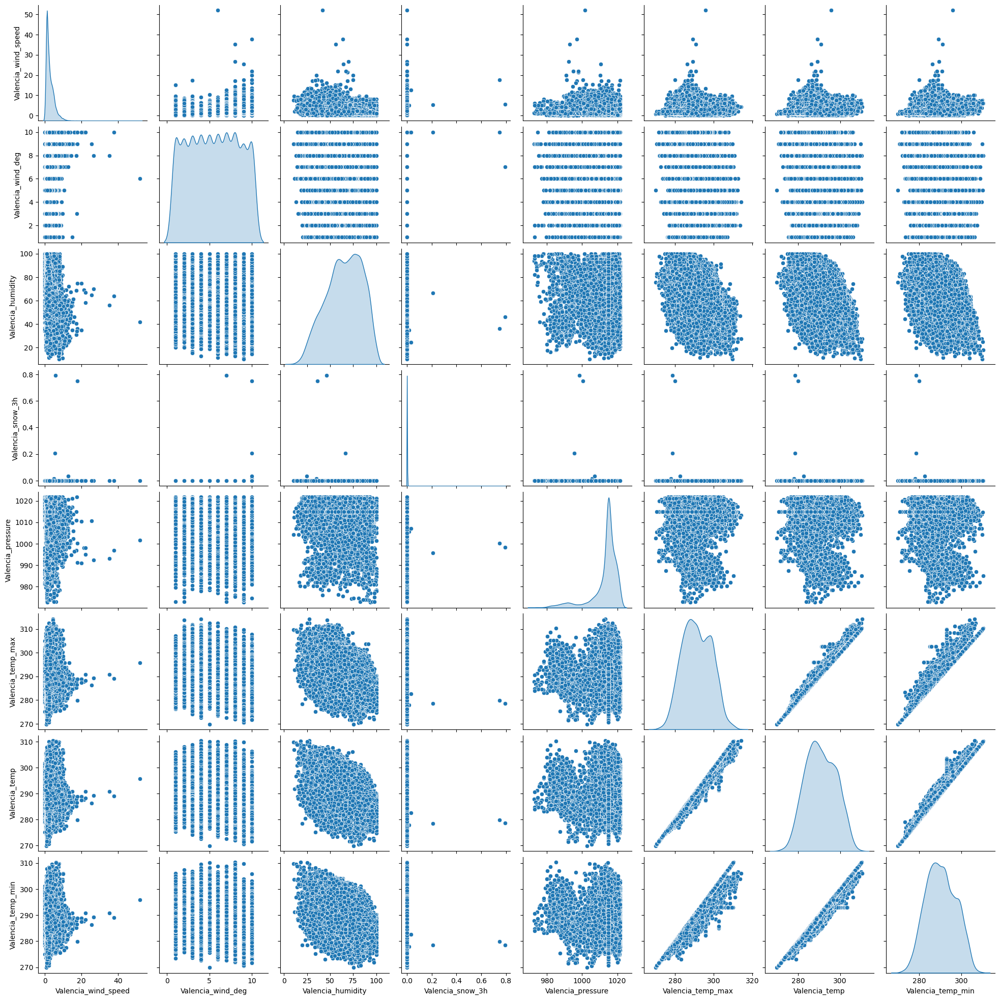

In [54]:
#
sns.pairplot(Valencia, diag_kind='kde')
#


Let us make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

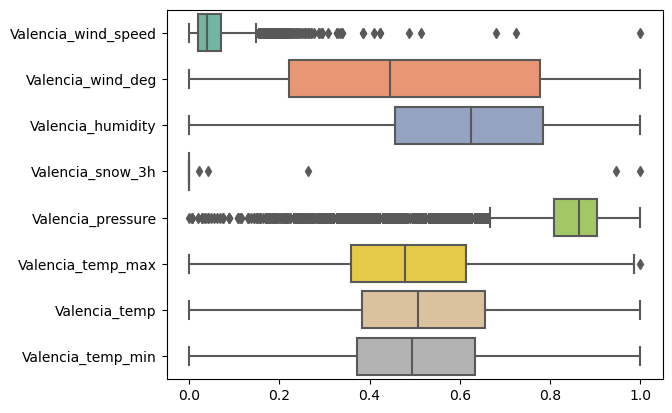

In [55]:
# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Valencia_ = pd.DataFrame(scaler.fit_transform(Valencia), columns=Valencia.columns)
sns.boxplot(data=Valencia_, orient="h", palette="Set2")
#


In [56]:
# sns.histplot(Valencia,kde=True)
#


Using the **heatmap** let us assess the correlation of the **Valencia** subset.

<Axes: >

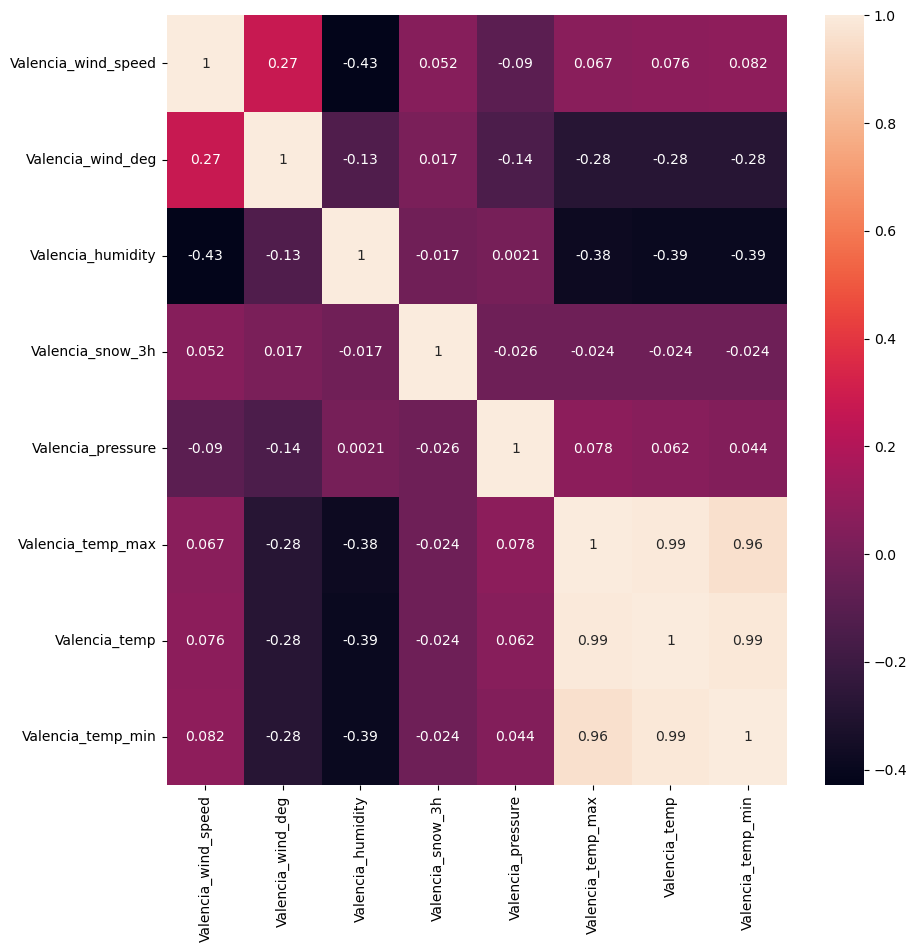

In [57]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Valencia.corr(), annot=True)
#

- **The *Bilbao* City subset.**

In [58]:
### Assigning all Madrid columns to a new variable.

Bilbao = df[['Bilbao_wind_speed',
             'Bilbao_wind_deg',
             'Bilbao_clouds_all',
             'Bilbao_pressure',
               'Bilbao_rain_1h',
               'Bilbao_snow_3h',
               'Bilbao_weather_id',
             'Bilbao_temp_max',
             'Bilbao_temp',
             'Bilbao_temp_min']]
Bilbao.head()

,Bilbao_wind_speed,Bilbao_wind_deg,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_weather_id,Bilbao_temp_max,Bilbao_temp,Bilbao_temp_min
0,1.000000,223.333333,0.0,1035.000000,0.0,0.0,800.0,269.338615,269.338615,269.338615
1,1.000000,221.000000,0.0,1035.666667,0.0,0.0,800.0,270.376000,270.376000,270.376000
2,1.000000,214.333333,0.0,1036.000000,0.0,0.0,800.0,275.027229,275.027229,275.027229
3,1.000000,199.666667,0.0,1036.000000,0.0,0.0,800.0,281.135063,281.135063,281.135063
4,0.333333,185.000000,2.0,1035.333333,0.0,0.0,800.0,282.252063,282.252063,282.252063


Let's remove any outliers in the **Bilbao** subset above. In case there are any, so that we avoid them influencing our model.

In [59]:
### remove outliers
Bilbao[(np.abs(stats.zscore(Bilbao)) < 3).all(axis=1)]

,Bilbao_wind_speed,Bilbao_wind_deg,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_weather_id,Bilbao_temp_max,Bilbao_temp,Bilbao_temp_min
0,1.000000,223.333333,0.000000,1035.000000,0.0,0.0,800.000000,269.338615,269.338615,269.338615
1,1.000000,221.000000,0.000000,1035.666667,0.0,0.0,800.000000,270.376000,270.376000,270.376000
2,1.000000,214.333333,0.000000,1036.000000,0.0,0.0,800.000000,275.027229,275.027229,275.027229
3,1.000000,199.666667,0.000000,1036.000000,0.0,0.0,800.000000,281.135063,281.135063,281.135063
4,0.333333,185.000000,2.000000,1035.333333,0.0,0.0,800.000000,282.252063,282.252063,282.252063
...,...,...,...,...,...,...,...,...,...,...
2915,1.333333,70.000000,80.000000,1034.666667,0.0,0.0,734.333333,276.150000,273.210000,270.816667
2916,1.000000,36.666667,56.666667,1034.333333,0.0,0.0,747.666667,278.816667,278.443333,278.150000
2917,0.666667,14.666667,0.000000,1033.000000,0.0,0.0,800.000000,285.816667,285.073333,284.150000
2918,0.666667,19.000000,0.000000,1033.333333,0.0,0.0,800.000000,282.816667,281.626667,280.150000


Now let's assess the **Bilbao** datatypes and also verify if are there any Null-values

In [60]:
Bilbao.info()
### Bilbao.isnull()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11683 entries, 0 to 2919
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Bilbao_wind_speed  11683 non-null  float64
 1   Bilbao_wind_deg    11683 non-null  float64
 2   Bilbao_clouds_all  11683 non-null  float64
 3   Bilbao_pressure    11683 non-null  float64
 4   Bilbao_rain_1h     11683 non-null  float64
 5   Bilbao_snow_3h     11683 non-null  float64
 6   Bilbao_weather_id  11683 non-null  float64
 7   Bilbao_temp_max    11683 non-null  float64
 8   Bilbao_temp        11683 non-null  float64
 9   Bilbao_temp_min    11683 non-null  float64
dtypes: float64(10)
memory usage: 1004.0 KB


Since our data is in a correct format, let us perform some **Statical Analysis** (our five Number Summary).

In [61]:
Bilbao.describe().T

,count,mean,std,min,25%,50%,75%,max
Bilbao_wind_speed,11683.0,1.958629,1.696043,0.000000,1.000000,1.333333,2.666667,12.666667
Bilbao_wind_deg,11683.0,159.878855,101.005654,0.000000,76.666667,145.666667,233.333333,360.000000
Bilbao_clouds_all,11683.0,43.440712,32.046215,0.000000,12.000000,45.000000,75.000000,100.000000
Bilbao_pressure,11683.0,1017.482011,9.753552,971.333333,1013.333333,1018.666667,1023.333333,1042.000000
Bilbao_rain_1h,11683.0,0.118698,0.334918,0.000000,0.000000,0.000000,0.100000,3.000000
Bilbao_snow_3h,11683.0,0.023936,0.482817,0.000000,0.000000,0.000000,0.000000,21.300000
Bilbao_weather_id,11683.0,727.800750,113.616789,207.333333,701.000000,800.000000,801.666667,804.000000
Bilbao_temp_max,11683.0,288.095397,6.898601,269.063000,283.150000,287.816667,292.483333,317.966667
Bilbao_temp,11683.0,286.447784,6.738466,267.483333,281.483448,286.193333,291.040000,310.710000
Bilbao_temp_min,11683.0,284.993657,6.730076,264.483333,280.122526,284.816667,289.816667,309.816667


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends.

In [62]:
for index, column in enumerate(Bilbao.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)



Now that we have performed the **Statical Aanalysis** to the **Bilbao** subset is in a Numerical format, let's make a use of the **PairPlot**.

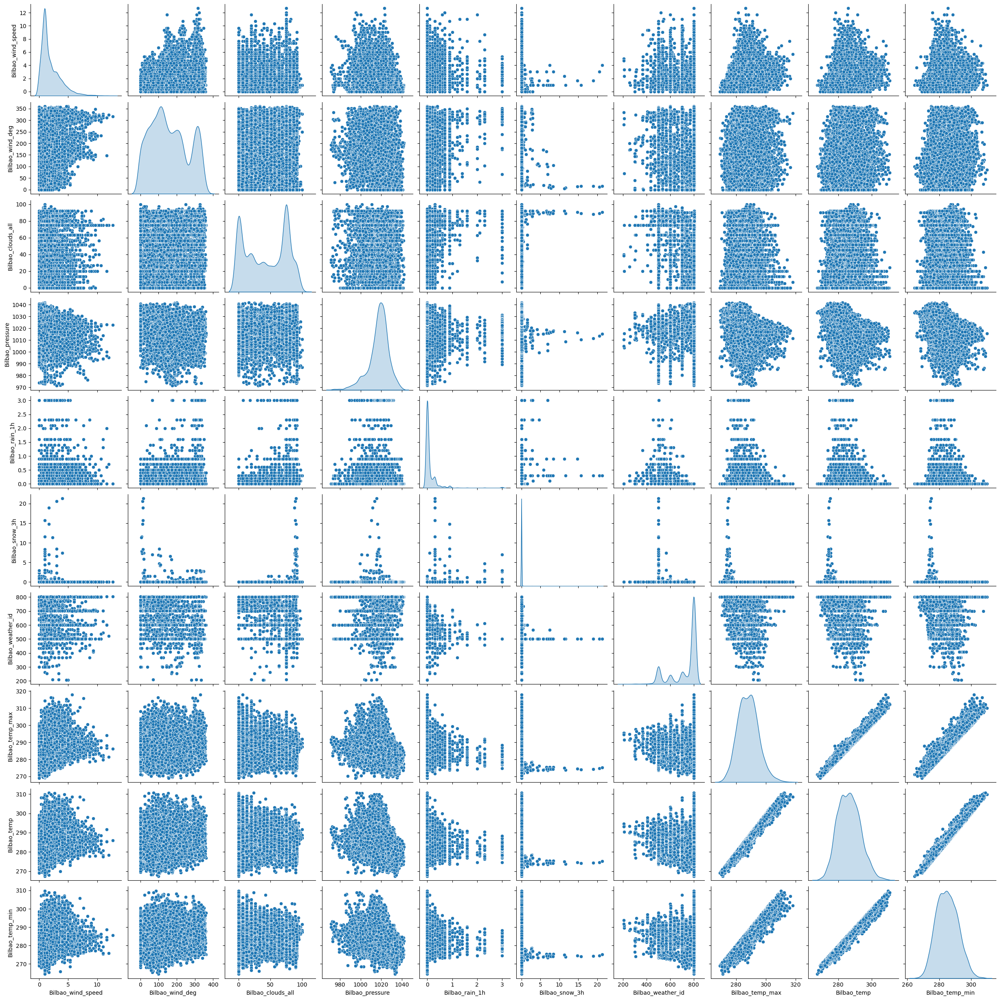

In [63]:

sns.pairplot(Bilbao, diag_kind='kde')



Let us make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

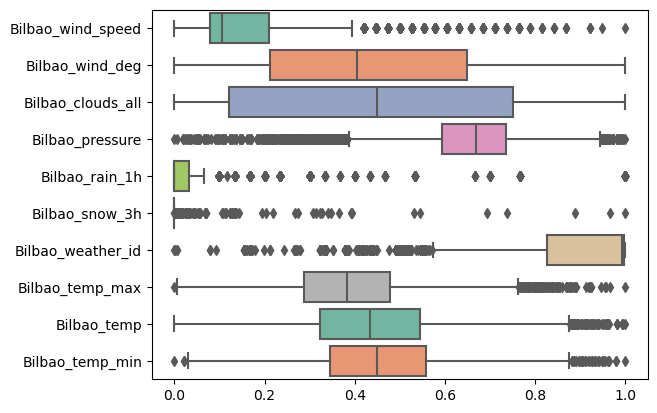

In [64]:
# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Bilbao_ = pd.DataFrame(scaler.fit_transform(Bilbao), columns=Bilbao.columns)
sns.boxplot(data=Bilbao_, orient="h", palette="Set2")
#

#

In [65]:
# sns.histplot(Bilbao,kde=True)
#


Using the **heatmap**, let us assess the correlation of the **Bilbao** subset.

<Axes: >

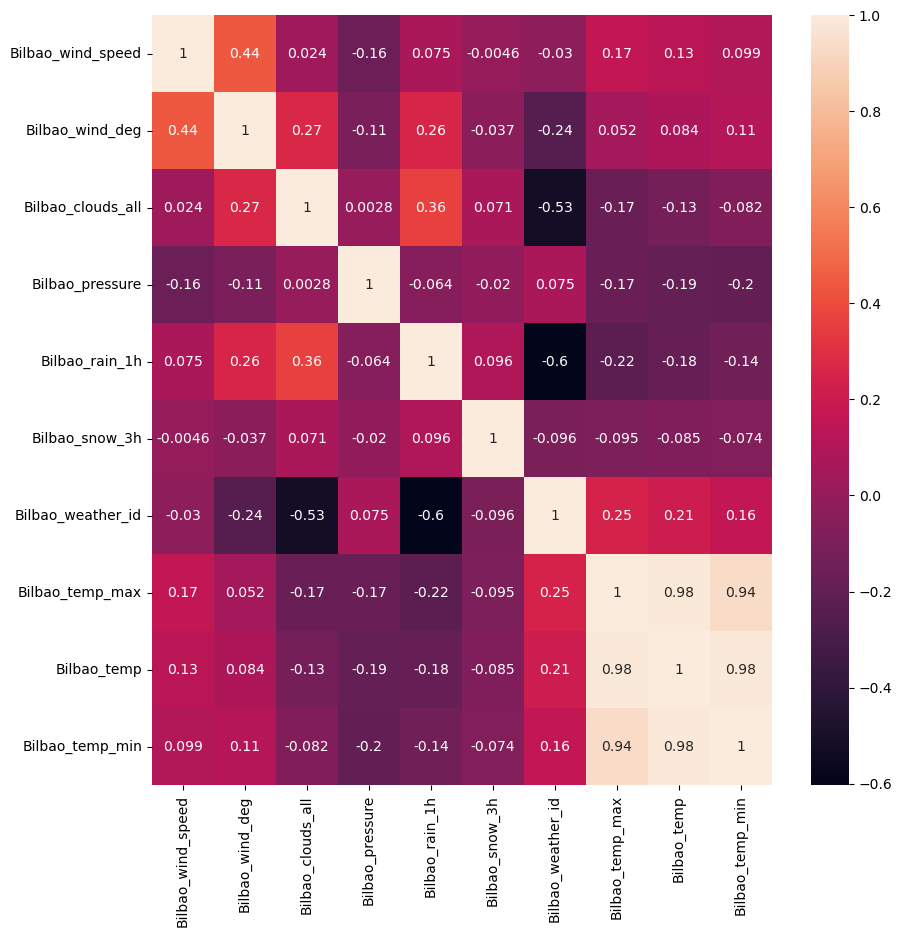

In [66]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Bilbao.corr(), annot=True)

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

On **heatmap** we created when performing the **EDA** of the entire dataset, there was a high correlation between the **Temperature** *columns*. So now let us analyse that.

In [67]:
## Creating a subset for the Temperature columns
Temp = df[['Madrid_temp','Madrid_temp_min','Madrid_temp_max',
           'Bilbao_temp','Bilbao_temp_min','Bilbao_temp_max',
           'Barcelona_temp','Barcelona_temp_min','Barcelona_temp_max',
           'Valencia_temp','Valencia_temp_min','Valencia_temp_max',
           'Seville_temp','Seville_temp_min','Seville_temp_max']].copy()

Using the **heatmap**, let us assess the *correlation*.

<Axes: >

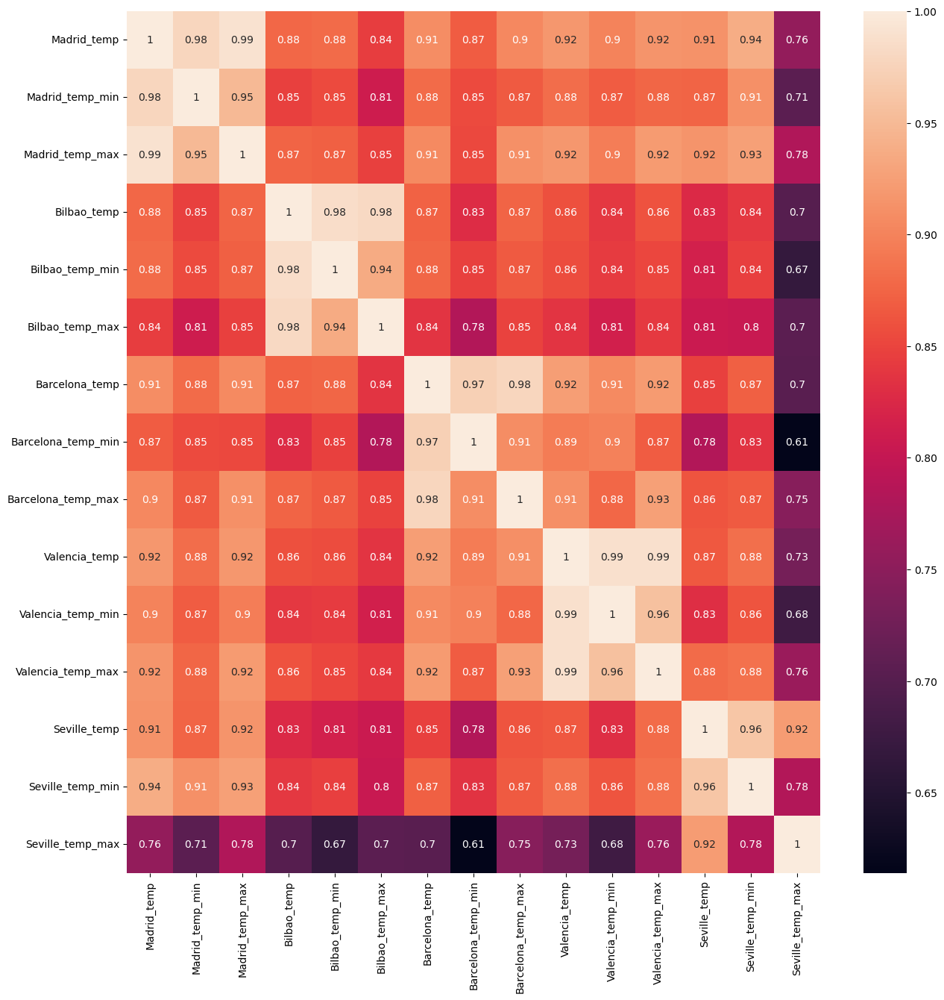

In [68]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(Temp.corr(), annot=True)

Now let us group them and try to understand the structure of the data as well.

In [69]:
data = pd.concat([df['time'],Madrid, Seville, Barcelona, Valencia, Bilbao], axis=1)
data.shape

(11683, 47)

As we have a **time** *column* in our data, let us convert it to a correct format in way that is easier for us to read.

In [70]:
Train = data.copy()

Train['time'] = pd.to_datetime(Train['time'])

Train['Day'] = Train['time'].dt.day
Train['Month'] = Train['time'].dt.month
Train['Year'] = Train['time'].dt.year
Train['Hour'] = Train['time'].dt.hour

Train = Train [['Year','Month','Day','Hour','Madrid_wind_speed', 'Madrid_humidity', 'Madrid_clouds_all',
       'Madrid_pressure', 'Madrid_rain_1h', 'Madrid_weather_id', 'Madrid_temp',
       'Seville_humidity', 'Seville_clouds_all', 'Seville_wind_speed',
       'Seville_pressure', 'Seville_rain_1h', 'Seville_rain_3h',
       'Seville_weather_id', 'Seville_temp', 'Barcelona_wind_speed',
       'Barcelona_wind_deg', 'Barcelona_rain_1h', 'Barcelona_pressure',
       'Barcelona_rain_3h', 'Barcelona_weather_id', 'Barcelona_temp',
       'Valencia_wind_speed', 'Valencia_wind_deg', 'Valencia_humidity',
       'Valencia_snow_3h', 'Valencia_pressure', 'Valencia_temp',
       'Bilbao_wind_speed', 'Bilbao_wind_deg', 'Bilbao_clouds_all',
       'Bilbao_pressure', 'Bilbao_rain_1h', 'Bilbao_snow_3h',
       'Bilbao_weather_id', 'Bilbao_temp']]

In [71]:
## Train.describe().T
Train.shape

(11683, 40)

In [92]:
from scipy.stats.mstats import winsorize
## handling outliers by replacing them 
for i in Train.columns:
    winsorized_data = winsorize(Train[i], limits=(0.05, 0.05))
    Train[i] = winsorized_data
    
Train.describe().T
Train.shape



C:\Users\user\anaconda3\lib\site-packages\numpy\lib\function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
C:\Users\user\anaconda3\lib\site-packages\numpy\lib\function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
C:\Users\user\anaconda3\lib\site-packages\numpy\lib\function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
C:\Users\user\anaconda3\lib\site-packages\numpy\lib\function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
C:\Users\user\anaconda3\lib\site-packages\numpy\lib\function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
C:\Users\user\anaconda3\lib\site-packages\numpy\lib\function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a

(11683, 26)

Columns with low variance often contain little information or contribute very little to the overall patterns in the data, so we rather remove them in a sense.

In [73]:
###removing columns with low variance
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0.1)
sel.fit_transform(Train)
Train.columns[sel.get_support(indices=True)]
Train = Train[Train.columns[sel.get_support(indices=True)]]
Train.describe().T
Train.shape 

(11683, 32)

Multicollinearity can negatively impact the predictive performance of a model. Highly correlated predictors can introduce redundancy and noise into the model, potentially leading to overfitting or poor generalization to new data. So let us see how can we handle them.

In [74]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

## mitigate multicollinearity

# Add a constant column to the predictor variables for the intercept term
Train = sm.add_constant(Train)

# Create a DataFrame to store the VIF values
vif_data = pd.DataFrame()

# Calculate the VIF for each predictor variable
vif_data['Variable'] = Train.columns
vif_data['VIF'] = [variance_inflation_factor(Train.values, i) for i in range(Train.shape[1])]

# Exclude columns with VIF greater than 5
columns_to_exclude = vif_data[vif_data['VIF'] > 5]['Variable']
Train = Train.drop(columns_to_exclude, axis=1)
Train.head()

,Year,Month,Day,Hour,Madrid_wind_speed,Madrid_clouds_all,Madrid_pressure,Madrid_weather_id,Seville_humidity,Seville_clouds_all,...,Barcelona_weather_id,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_pressure,Bilbao_wind_speed,Bilbao_wind_deg,Bilbao_clouds_all,Bilbao_pressure,Bilbao_weather_id
0,2015,1,2,3,0.666667,0.0,971.333333,800.0,74.333333,0.0,...,800.0,0.666667,5,75.666667,1002.666667,1.000000,223.333333,0.0,1031.0,800.0
1,2015,1,2,6,0.666667,0.0,972.666667,800.0,78.333333,0.0,...,800.0,1.666667,10,71.000000,1004.333333,1.000000,221.000000,0.0,1031.0,800.0
2,2015,1,2,9,1.000000,0.0,974.000000,800.0,71.333333,0.0,...,800.0,1.000000,9,65.666667,1005.333333,1.000000,214.333333,0.0,1031.0,800.0
3,2015,1,2,12,1.000000,0.0,994.666667,800.0,65.333333,0.0,...,800.0,1.000000,8,54.000000,1009.000000,1.000000,199.666667,0.0,1031.0,800.0
4,2015,1,2,15,1.000000,0.0,1029.666667,800.0,59.000000,0.0,...,800.0,1.000000,7,58.333333,1015.000000,0.333333,185.000000,2.0,1031.0,800.0


In [90]:
###Accesing train data
X = Train[:len(traindf)] #slicing the df to select the df==train_df and leave the rest that is the test_df
x_test = Train[len(traindf):] #the remaining df is the test_df
Y  = df[:len(traindf)][['load_shortfall_3h']] #our dependent variable
X.head()

,Year,Month,Day,Hour,Madrid_wind_speed,Madrid_clouds_all,Madrid_pressure,Madrid_weather_id,Seville_humidity,Seville_clouds_all,...,Barcelona_weather_id,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_pressure,Bilbao_wind_speed,Bilbao_wind_deg,Bilbao_clouds_all,Bilbao_pressure,Bilbao_weather_id
0,2015,1,2,3,0.666667,0.0,971.333333,800.0,74.333333,0.0,...,800.0,0.666667,5,75.666667,1002.666667,1.000000,223.333333,0.0,1031.0,800.0
1,2015,1,2,6,0.666667,0.0,972.666667,800.0,78.333333,0.0,...,800.0,1.666667,10,71.000000,1004.333333,1.000000,221.000000,0.0,1031.0,800.0
2,2015,1,2,9,1.000000,0.0,974.000000,800.0,71.333333,0.0,...,800.0,1.000000,9,65.666667,1005.333333,1.000000,214.333333,0.0,1031.0,800.0
3,2015,1,2,12,1.000000,0.0,994.666667,800.0,65.333333,0.0,...,800.0,1.000000,8,54.000000,1009.000000,1.000000,199.666667,0.0,1031.0,800.0
4,2015,1,2,15,1.000000,0.0,1029.666667,800.0,59.000000,0.0,...,800.0,1.000000,7,58.333333,1015.000000,0.333333,185.000000,2.0,1031.0,800.0


Let us now import the essential packages to build our Model.

In [91]:
#make sure to run this code cell
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn import tree
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import KFold
from sklearn.ensemble import GradientBoostingRegressor

# Training

### Linear Regression 

In [77]:
#Linear Regression
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# Create a linear regression model
modelL = LinearRegression()
# Fit the model to the training data
modelL.fit(X_train, y_train)

# Make predictions on the training set
y_train_pred = modelL.predict(X_train)

# Make predictions on the testing set
y_test_pred = modelL.predict(X_test)

# Evaluate the model
train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
test_rmse_linear = mean_squared_error(y_test, y_test_pred, squared=False)

# print(model.accuracy_score(X_test, y_test))

# Calculate R-squared for the testing set
r2 = r2_score(y_test, y_test_pred)

# Print the root mean squared error (RMSE) for training and testing data
print("Training RMSE:", train_rmse)
print("Testing RMSE:", test_rmse_linear)
print("R-squared:", r2)

Training RMSE: 4806.404100651987
Testing RMSE: 4902.576556092973
R-squared: 0.14656274006385916


### Random forest

Random forest with KFold with 5 splits

In [78]:

kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the cross-validation splits
for train_index, test_index in kf.split(X):
    # Split the data into training and testing sets
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Train your machine learning model
    model = RandomForestRegressor(n_estimators = 200, max_depth = None, min_samples_split = 25 , random_state = 42)
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)

# Make predictions on the testing set
    y_test_pred = model.predict(X_test)

# Evaluate the model
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)

# Calculate R-squared for the testing set
    r2 = r2_score(y_test, y_test_pred)

# Print the root mean squared error (RMSE) for training and testing data
    print("Training RMSE:", train_rmse)
    print("Testing RMSE:", test_rmse)
    print("R-squared:", r2) 

C:\Users\user\AppData\Local\Temp\ipykernel_36936\2085896278.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


Training RMSE: 2390.693325845318
Testing RMSE: 3365.657752158114
R-squared: 0.5977808592344409


C:\Users\user\AppData\Local\Temp\ipykernel_36936\2085896278.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


Training RMSE: 2407.424008812927
Testing RMSE: 3213.815553955588
R-squared: 0.6224954726660725


C:\Users\user\AppData\Local\Temp\ipykernel_36936\2085896278.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


Training RMSE: 2395.0834015650576
Testing RMSE: 3308.9504172498096
R-squared: 0.6018589420871872


C:\Users\user\AppData\Local\Temp\ipykernel_36936\2085896278.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


Training RMSE: 2395.391128890304
Testing RMSE: 3331.7374615149247
R-squared: 0.574802432406178


C:\Users\user\AppData\Local\Temp\ipykernel_36936\2085896278.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


Training RMSE: 2410.191181165937
Testing RMSE: 3278.4575919710883
R-squared: 0.6014311330151301


### Decision Tree


In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
modelDT = tree.DecisionTreeRegressor(max_depth=5)

modelDT.fit(X_train, y_train)

# Make predictions on the training set
y_train_pred = modelDT.predict(X_train)

# Make predictions on the testing set
y_test_pred = modelDT.predict(X_test)

# Evaluate the model
train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
test_rmse_dt = mean_squared_error(y_test, y_test_pred, squared=False)

# Calculate R-squared for the testing set
r2 = r2_score(y_test, y_test_pred)

# Print the root mean squared error (RMSE) for training and testing data
print("Training RMSE:", train_rmse)
print("Testing RMSE:", test_rmse_dt)
print("R-squared:", r2)

Training RMSE: 4065.392183522986
Testing RMSE: 4255.2829459310915
R-squared: 0.35704627443544423


below is a KFold with 5 Splits, it trains the Decision Tree on each split and it evaluates the RMSE score everytime

In [79]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the cross-validation splits
for train_index, test_index in kf.split(X):
    # Split the data into training and testing sets
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Train your machine learning model
    modeltree = tree.DecisionTreeRegressor(max_depth=15, min_samples_split=18, random_state=42)
    modeltree.fit(X_train, y_train)

    y_train_pred = modeltree.predict(X_train)

# Make predictions on the testing set
    y_test_pred = modeltree.predict(X_test)

# Evaluate the model
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)

# Calculate R-squared for the testing set
    r2 = r2_score(y_test, y_test_pred)

# Print the root mean squared error (RMSE) for training and testing data
    print()
    print("Training RMSE:", train_rmse)
    print("Testing RMSE:", test_rmse)
    print("R-squared:", r2)


Training RMSE: 2278.0229191540343
Testing RMSE: 4110.0380579036155
R-squared: 0.4001888728445069

Training RMSE: 2233.772855937407
Testing RMSE: 3792.707997750953
R-squared: 0.4742502404096258

Training RMSE: 2255.597117814374
Testing RMSE: 4210.929289321512
R-squared: 0.3552188322591634

Training RMSE: 2272.855806938962
Testing RMSE: 4062.429170277899
R-squared: 0.36784899690826556

Training RMSE: 2212.7568101211305
Testing RMSE: 3938.8572914354613
R-squared: 0.42468628961007504


### Gradient Boosting Regressor

In [84]:
#combination of models

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Create individual models
rf_model = RandomForestRegressor(n_estimators=100, max_depth=5, min_samples_split=18, random_state=42)
gb_model = GradientBoostingRegressor(n_estimators=140, max_depth=6, random_state=42)
ada_model = AdaBoostRegressor(n_estimators=100, random_state=42)

# Fit the individual models to the training data
rf_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)
ada_model.fit(X_train, y_train)

# Make predictions using the individual models
y_test_pred_rf = rf_model.predict(X_test)
y_test_pred_gb = gb_model.predict(X_test)
y_test_pred_ada = ada_model.predict(X_test)

# Evaluate the individual models
rf_rmse = mean_squared_error(y_test, y_test_pred_rf, squared=False)
gb_rmse = mean_squared_error(y_test, y_test_pred_gb, squared=False)
ada_rmse = mean_squared_error(y_test, y_test_pred_ada, squared=False)

rf_r2 = r2_score(y_test, y_test_pred_rf)
gb_r2 = r2_score(y_test, y_test_pred_gb)
ada_r2 = r2_score(y_test, y_test_pred_ada)

# Print the results
print("Random Forest RMSE:", rf_rmse)
print("Random Forest R-squared:", rf_r2)
print("Gradient Boosting RMSE:", gb_rmse)
print("Gradient Boosting R-squared:", gb_r2)
print("AdaBoost RMSE:", ada_rmse)
print("AdaBoost R-squared:", ada_r2)


C:\Users\user\AppData\Local\Temp\ipykernel_36936\3749518544.py:16: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_model.fit(X_train, y_train)
C:\Users\user\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\user\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Random Forest RMSE: 4178.0175129459885
Random Forest R-squared: 0.38018319990560323
Gradient Boosting RMSE: 2964.4672187483097
Gradient Boosting R-squared: 0.6879557847448551
AdaBoost RMSE: 4409.029247605562
AdaBoost R-squared: 0.309746224239262


In [80]:


kf = KFold(n_splits=3, shuffle=True, random_state=42)

# Iterate over the cross-validation splits
for train_index, test_index in kf.split(X):
    # Split the data into training and testing sets
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Train your machine learning model
    modelGB = GradientBoostingRegressor(n_estimators=100, max_depth = 7 , random_state= 15,max_features="sqrt")
    modelGB.fit(X_train, y_train)

    y_train_pred = modelGB.predict(X_train)

# Make predictions on the testing set
    y_test_pred = modelGB.predict(X_test)

# Evaluate the model
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)

# Calculate R-squared for the testing set
    r2 = r2_score(y_test, y_test_pred)

# Print the root mean squared error (RMSE) for training and testing data
    print()
    print("Training RMSE:", train_rmse)
    print("Testing RMSE:", test_rmse)
    print("R-squared:", r2)

C:\Users\user\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Training RMSE: 1522.5914992987307
Testing RMSE: 3256.8895435138406
R-squared: 0.6200677626913407


C:\Users\user\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Training RMSE: 1579.0292210284208
Testing RMSE: 3195.0417234608813
R-squared: 0.6220398362076902


C:\Users\user\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Training RMSE: 1583.2184438308432
Testing RMSE: 3233.983944581151
R-squared: 0.6088496395967662


<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

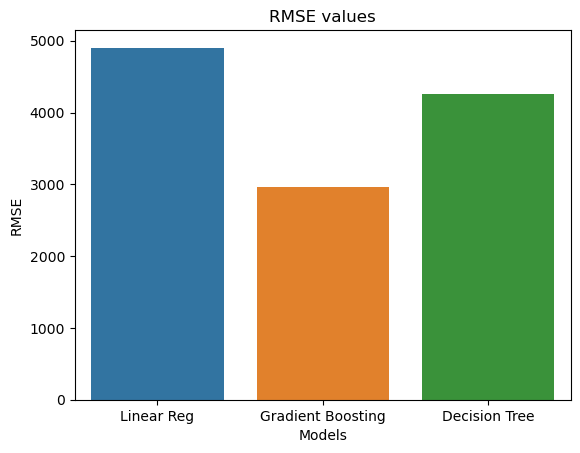

In [89]:
x = ["Linear Reg", "Gradient Boosting", "Decision Tree"]
test_rmse = [test_rmse_linear, gb_rmse, test_rmse_dt] #testRMSE scores

sns.barplot(x=x, y=test_rmse)
plt.title("RMSE values")
plt.xlabel("Models")
plt.ylabel("RMSE")
plt.show()

# plt.savefig("rmse_plot.png") #Uncomment to savefig

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

**How did we pick a good model?**

To determine how good a model is, we utilized the root mean square error (RMSE). The RMSE calculates the difference in predicted and actual values. A large RMSE suggests that our model is not capable of analyzing and forecasting new values. The RMSE score we consider is the RMSE score of the test datasets from our previously indicated 80/20 split.

According to the graph above, the gradient-boosting regressor was the best-performing model. All of the models we utilize can solve regression issues, and the gradient-boosting regressor and decision tree are also effective for classification problems.



In contrast to the linear regression model, the gradient regressor considers the relationship between X and y complex. This is more accurate than linear regression, which assumes a linear relationship. With the ability to deal with complex relationships and fine-tune the model, makes the gradient boosting the best model.

It has multiple models because it is an ensemble model. The following model in line learns from the preceding model's mistakes. The accuracy of the model is also affected by the hyperparameters, and this model provided us with the highest score.

# Testing

This is where we prepare our model predictions to be in the Kaggle Format

In [ ]:
pred = modelGB.predict(x_test)

df2 = pd.DataFrame(pred, columns=['load_shortfall_3h'])
df2.head()

In [ ]:
output  = pd.DataFrame({'time': testdf['time'], 'load_shortfall_3h': df2['load_shortfall_3h']})
output.head()
output.to_csv('GB1.csv', index=False)

#### These are some of the recommendations we've compiled for the Spanish government.

1. **Improve Data Annotation:** They could enhance data annotation so that any data scientist can understand the numbers in each column.

2. **Energy Efficiency Measures:** Promote energy efficiency measures and energy-efficient technologies among the general public. The energy-saving solution should be a joint state-citizen endeavour.

3. **Capture energy consumption at the city level:** The dataset should capture energy consumption at the city level in order for the government to understand energy consumption and generation per city. Understanding energy use will make it much easier for the Spanish government to plan for the repair and management of the energy infrastructure.

4. **Use the Model to Understand Spain's Energy Needs:** Our model will assist the Spanish government in forecasting the electricity shortfall. They can always prepare and protect their inhabitants so that they never go without power. To meet their 2050 electricity mix objective, they will need to understand the overall trends of their electricity use via load shortfall, which our model excels at.

5. **Invest in Alternative Energy Generation:** Investing in alternative energy sources prepares the country for unexpected events in the future. A recent example would be the Russia-Ukraine War, in which several European countries are struggling due to their reliance on Russian gas. Energy storage and alternative generation can assist the Spanish government in maximizing its electricity generation and storing any excess energy.

6. **Take into account population growth:** Spain has been grappling with an increase in immigration and population growth. Population growth will result in increased energy demand, as previously stated.